
### **Notebook description**
This notebook allows to visualize predicted damage masks for a dataset directory that contains the folder "images" (optionally the folder "labels").

It uses the Segformer pre-trained semantic segmentation model contained in "stepwise_model_classification.ipynb" and saved in the folder named as the variable "name_model" (see below).

The path to the images is defined in the variable "path_images" (and optionally, you can give as well "path_label"), see below.

In [20]:
import numpy as np
import tensorflow as tf
import os
from os import path, walk
import json

import matplotlib.pyplot as plt


### Path to data and model

In [21]:
# path to images (normal case, new dataset without labels)
path_images="../data/last_subset/train/images"
# OPTIONAL, path to labels (in case json file exist, only propose is to identify the name and type of disaster)
path_labels="../data/last_subset/train/labels"

# name folder (located here) where the segformer model is saved
name_model="classification_model_test1"


### Functions definition

In [22]:
def read_json(json_path):
    """
    :param json_path: path to load json from
    :returns: a python dictionary of json features
    """
    annotations = json.load(open(json_path))
    return annotations

In [23]:
def get_disaster_info(feature):
    """
    Creates 2 lists with disaster name and disaster type
    :param feature: a python dictionary of json labels ( pre- or post-disaster)
    :returns: 2 lists with length = n pre_images = n post_images
    
    """
 
    try:
        disaster = feature['metadata']['disaster']
        disaster_type = feature['metadata']['disaster_type']
    except:
        disaster = 'unclassified'
        disaster_type = 'unclassified'
        print("no disaster information in "+feature['metadata']['img_name'])
         

    return disaster,disaster_type

In [24]:
# this function is using labels,only with the propose of showcasing --> we want to identify which type of disaster and its name.
# in the case of real new images, it will not be possible to get that information, and only the images directory is needed 
def create_image_tensors(images_path, json_path=None):
    """
    Creates tensors for pre and post images.
    :param images_path: path to pre- and post-disaster images
    :param json_path (optional): path to pre- and post-disaster json files
    :returns: image and mask tensors pre- and post-disaster (if json_path: adds ID (pre- post-pair)
    ,disaster name and type)
    """
    arr_img_pre_list = []
    arr_img_post_list = []

    # Check if json_path is a valid directory
    if json_path and os.path.isdir(json_path):
        id_pre_list = []
        id_post_list = []
        dis_list = []
        dis_type_list = []

        # For each feature in the json we will create a separate mask
        # Getting all files in the directory provided for jsons
        jsons_pre = [j for j in next(walk(json_path))[2] if '_pre' in j]
        # After removing non-json items in dir (if any)
        for j in [j for j in jsons_pre if j.endswith('json')]:
            # Our chips start off in life as PNGs
            chip_image_id_pre = path.splitext(j)[0] + '.png'
            chip_image_id_post = path.splitext(j)[0].replace('_pre', '_post') + '.png'

            id_pre = path.splitext(j)[0]
            id_post = path.splitext(j)[0].replace('_pre', '_post')

            # Loading the per chip json pre-disaster
            j_full_path_pre = path.join(json_path, j)
            chip_json_pre = read_json(j_full_path_pre)
            
            #getting the name of the post-json
            j_post = j.replace('_pre', '_post')
            #print(j_post)
            
            # Loading the per chip json post-disaster
            j_full_path_post = path.join(json_path, j_post)
            chip_json_post = read_json(j_full_path_post)

            # Getting the full chip path, and loading the size dimensions (same for post)
            chip_file_pre = path.join(images_path, chip_image_id_pre)
            chip_file_post = path.join(images_path, chip_image_id_post)

            # creating tensors from images
            img_pre = tf.io.read_file(chip_file_pre)
            img_post = tf.io.read_file(chip_file_post)
            array_pre = tf.image.decode_png(img_pre, channels=3, dtype=tf.uint8)
            array_post = tf.image.decode_png(img_post, channels=3, dtype=tf.uint8)
            
            dis,dis_type = get_disaster_info(chip_json_pre)
            
            arr_img_pre_list.append(array_pre)
            arr_img_post_list.append(array_post)
            #creating id and id_disaster lists to identify the arrays
            id_pre_list.append(id_pre)
            id_post_list.append(id_post)
            dis_list.append(dis)
            dis_type_list.append(dis_type)
        return arr_img_pre_list, arr_img_post_list, id_pre_list, id_post_list, dis_list, dis_type_list
       
    else:
        # For each feature in the json we will create a separate mask
        # Getting all files in the directory provided for jsons
        images_pre = [j for j in next(walk(images_path))[2] if '_pre' in j]
        # After removing non-json items in dir (if any)
        for j in [j for j in images_pre if j.endswith('png')]:
            # Our chips start off in life as PNGs
            chip_image_id_pre = j
            chip_image_id_post = j.replace('_pre', '_post')

            id_pre = path.splitext(j)[0]
            id_post = path.splitext(j)[0].replace('_pre', '_post')

            # Getting the full chip path, and loading the size dimensions (same for post)
            chip_file_pre = path.join(images_path, chip_image_id_pre)
            chip_file_post = path.join(images_path, chip_image_id_post)

            img_pre = tf.io.read_file(chip_file_pre)
            img_post = tf.io.read_file(chip_file_post)
            array_pre = tf.image.decode_png(img_pre, channels=3, dtype=tf.uint8)
            array_post = tf.image.decode_png(img_post, channels=3, dtype=tf.uint8)
            
            arr_img_pre_list.append(array_pre)
            arr_img_post_list.append(array_post)
            
        return arr_img_pre_list, arr_img_post_list
        

     
    

In [28]:

def convert_mask_to_3_channels(mask_1_channel):
    """convert 1 channel mask (numpy array) in 3 channel mask, preserving labels 
    defined in "category_colors" dictionary
    
    Args:
        mask (~numpy.ndarray): A mask array with 1 dimension.
        
    Returns:
        mask (~numpy.ndarray) with 3 channels.
    """
    # Assuming mask_1_channels has shape (height, width, 1)
    height, width, _ = mask_1_channel.shape

    # Create an empty array with shape (height, width, 1) for the single-channel mask
    deep_mask = np.zeros((height, width, 3), dtype=np.uint8)

    # Define the colors representing each category (RGB values)
    category_colors = {
        0:(0, 0, 0),        # Class 0 - Black (no building) or un-classified
        1:(255, 255, 255),  # Class 1 - White (no-damage)
        2:(255,255,0),     # Class 2 - Yellow (minor damage)
        3:(255,165,0),     # Class 3 - Orange (major damage)
        4:(255, 0, 0),     # Class 4 - Red (destroyed)
    }
    # Loop through each pixel and assign the corresponding category to the single-channel mask
    for y in range(height):
        for x in range(width):
            pixel_color = mask_1_channel[y, x, 0]
            category = category_colors.get(pixel_color, (-1,-1,-1))  # -1 for unknown category
            deep_mask[y, x] = category

    return deep_mask

def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ["Input Image", "Predicted Mask"]

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
    # Create the folder if it doesn't exist
    plt.show()


In [29]:
def create_mask_single(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=1)
    pred_mask = tf.expand_dims(pred_mask, -1)
    return pred_mask

In [30]:
def map_fn(image):
    # Assign names to the elements in the dataset
    return {"image": image}



In [34]:
from tensorflow.keras import backend

image_size = 512
mean = tf.constant([0.485, 0.456, 0.406])
std = tf.constant([0.229, 0.224, 0.225])


def normalize(input_image):
    input_image = tf.image.convert_image_dtype(input_image, tf.float32)
    input_image = (input_image - mean) / tf.maximum(std, backend.epsilon())
    return input_image


def load_image(datapoint):
    input_image = tf.image.resize(datapoint["image"], (image_size, image_size))
    input_image = normalize(input_image)
    input_image = tf.transpose(input_image, (2, 0, 1))
    return {"pixel_values": input_image}    

### Creating tensors

In [10]:
# without label info
# img_pre,img_post = create_image_tensors(path_images)

# images_pre = np.stack(img_pre)
# images_post = np.stack(img_post)

In [25]:
# with label info = give json_path and images_path (only to get the disaster label, showcase proposes)
img_pre,img_post,id_pre, id_post, dis, dis_type = create_image_tensors(path_images,path_labels)

images_pre = np.stack(img_pre)
images_post = np.stack(img_post)

In [26]:
print("disaster names in this dataset: ",np.unique(dis))

disaster names in this dataset:  ['guatemala-volcano' 'hurricane-florence' 'hurricane-harvey'
 'hurricane-matthew' 'hurricane-michael' 'mexico-earthquake'
 'midwest-flooding' 'palu-tsunami' 'santa-rosa-wildfire' 'socal-fire']


### Pre-processing data to use SegFormer model

In [35]:
# fconvert to tensorflow dataset
post_dataset = tf.data.Dataset.from_tensor_slices((images_post))


In [36]:
# giving name to tensorflow dataset
named_post_dataset = post_dataset.map(map_fn)


In [38]:
# applying normalzation, resizing and transposing 
post = (named_post_dataset.map(load_image))

### Predicting and showing results

All model checkpoint layers were used when initializing TFSegformerForSemanticSegmentation.

All the layers of TFSegformerForSemanticSegmentation were initialized from the model checkpoint at classification_model_test1.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFSegformerForSemanticSegmentation for predictions without further training.


santa-rosa-wildfire santa-rosa-wildfire_00000120_post_disaster
1/1 [==============================] - 2s 2s/step
predicted classes:  [0 1 3 4]


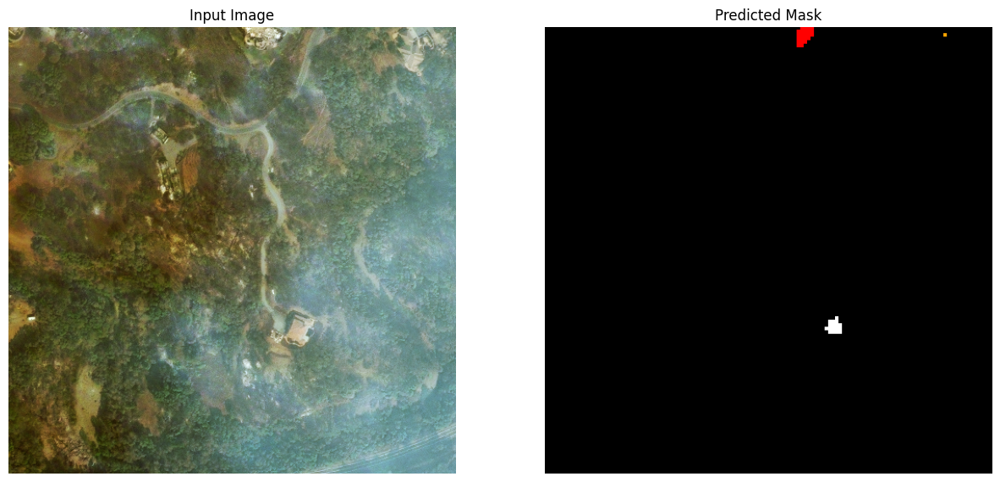

midwest-flooding midwest-flooding_00000207_post_disaster
1/1 [==============================] - 0s 489ms/step
predicted classes:  [0 1 3]


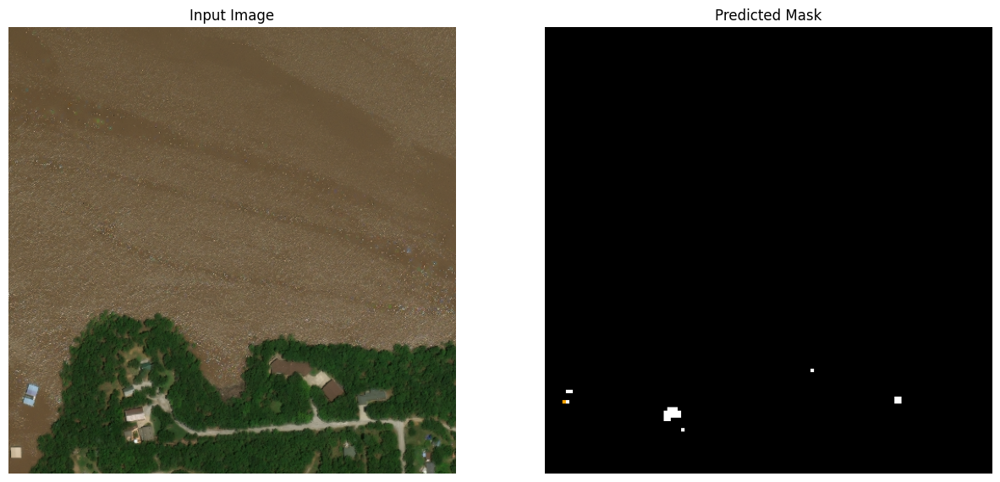

hurricane-michael hurricane-michael_00000401_post_disaster
1/1 [==============================] - 1s 524ms/step
predicted classes:  [0 1 3]


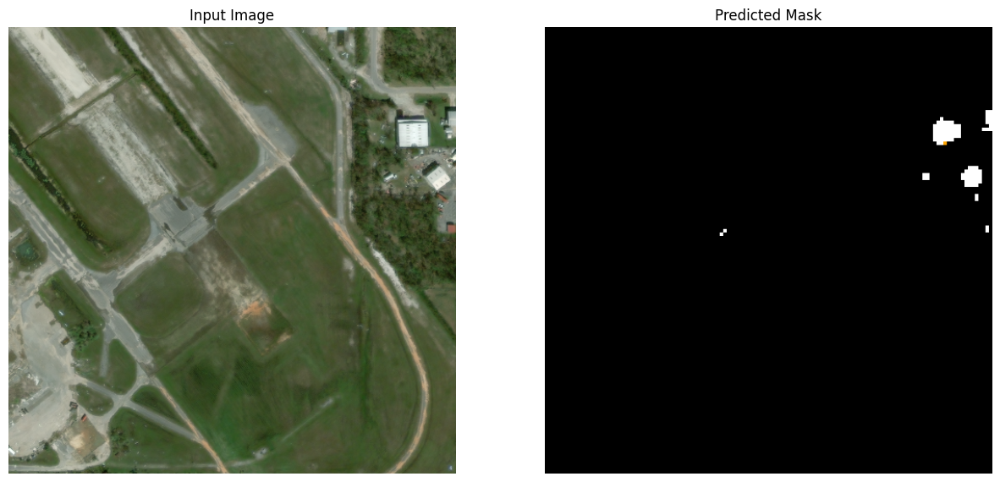

hurricane-matthew hurricane-matthew_00000093_post_disaster
1/1 [==============================] - 0s 492ms/step
predicted classes:  [0]


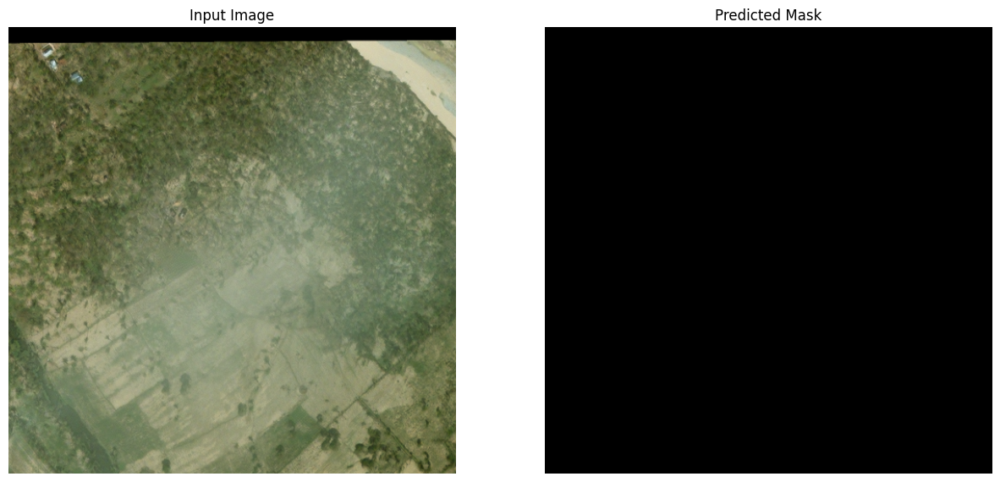

socal-fire socal-fire_00001298_post_disaster
1/1 [==============================] - 1s 515ms/step
predicted classes:  [0 1]


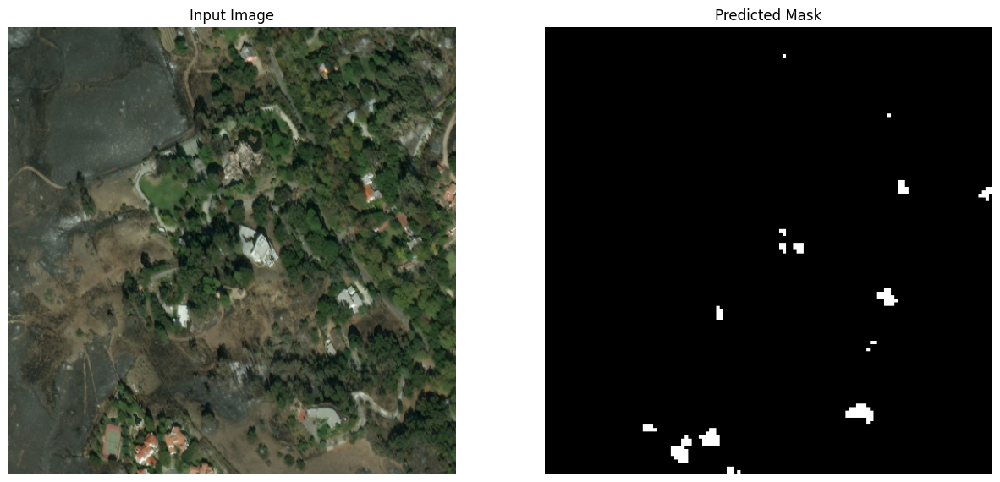

hurricane-harvey hurricane-harvey_00000289_post_disaster
1/1 [==============================] - 0s 482ms/step
predicted classes:  [0]


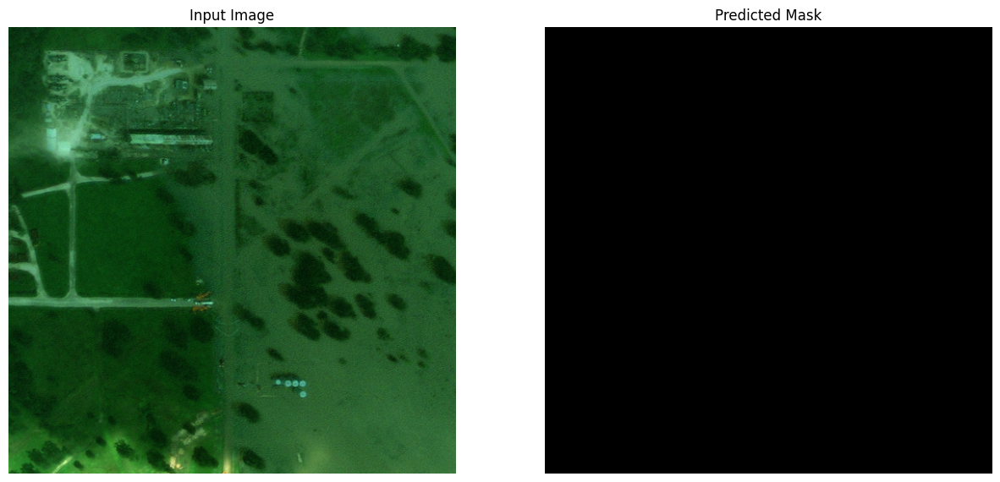

hurricane-harvey hurricane-harvey_00000513_post_disaster
1/1 [==============================] - 0s 499ms/step
predicted classes:  [0 1 2 3]


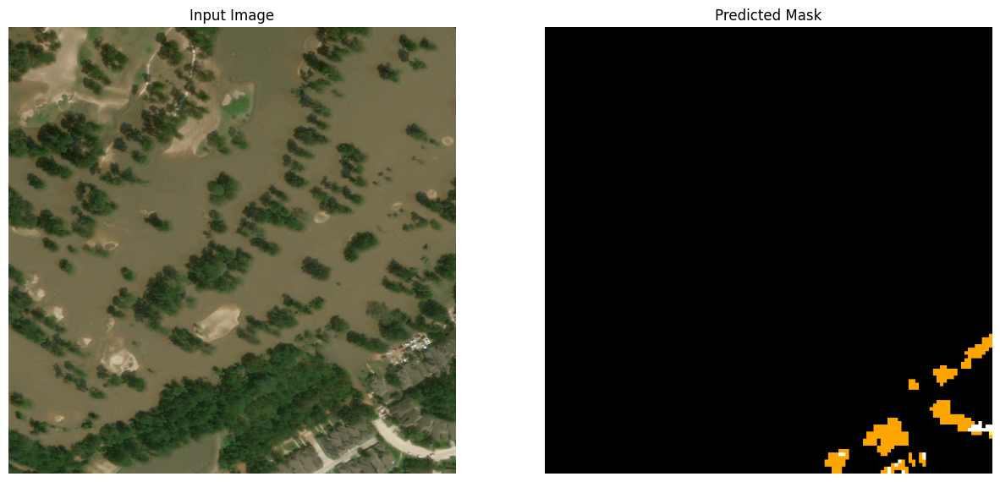

socal-fire socal-fire_00000130_post_disaster
1/1 [==============================] - 1s 503ms/step
predicted classes:  [0]


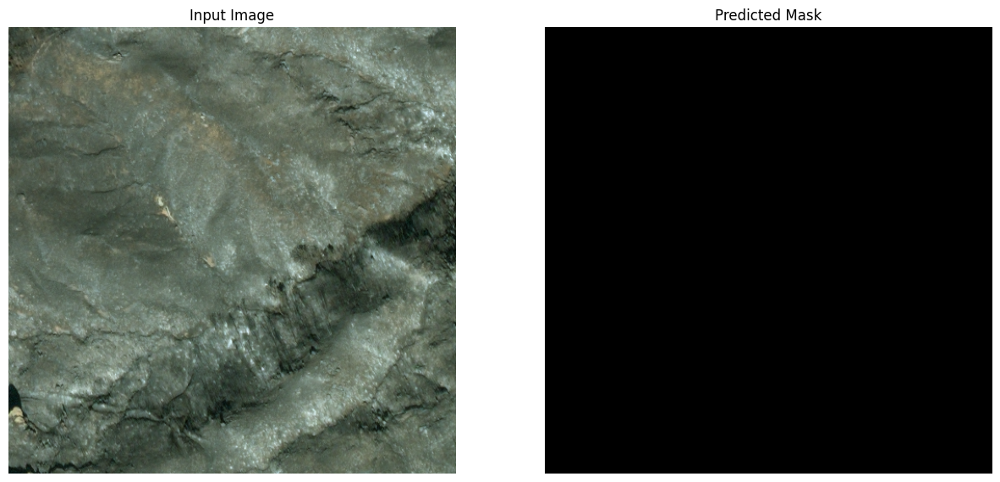

hurricane-matthew hurricane-matthew_00000139_post_disaster
1/1 [==============================] - 1s 516ms/step
predicted classes:  [0]


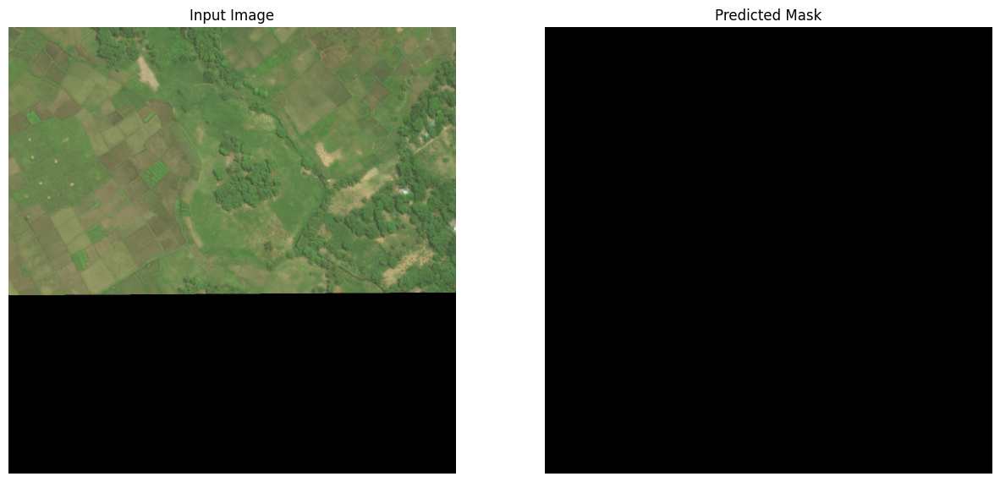

hurricane-harvey hurricane-harvey_00000323_post_disaster
1/1 [==============================] - 1s 531ms/step
predicted classes:  [0]


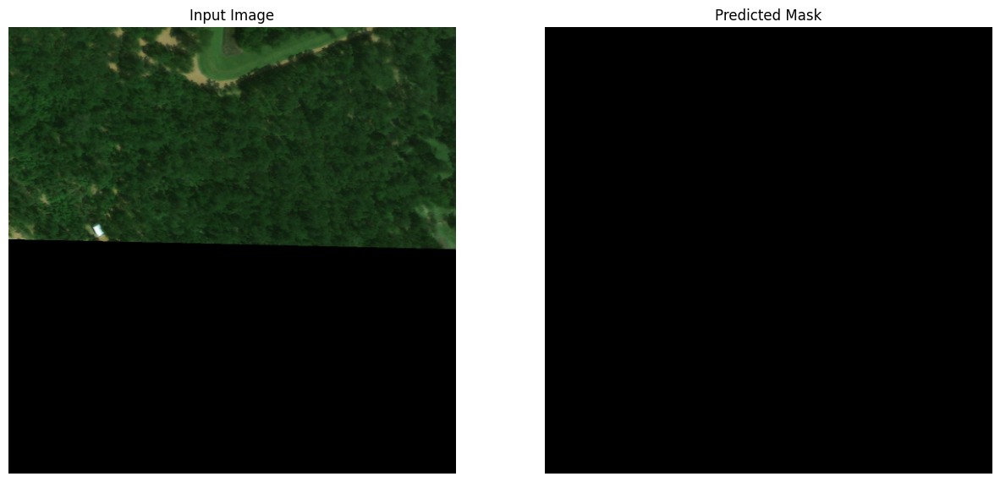

hurricane-florence hurricane-florence_00000158_post_disaster
1/1 [==============================] - 1s 560ms/step
predicted classes:  [0 1 3]


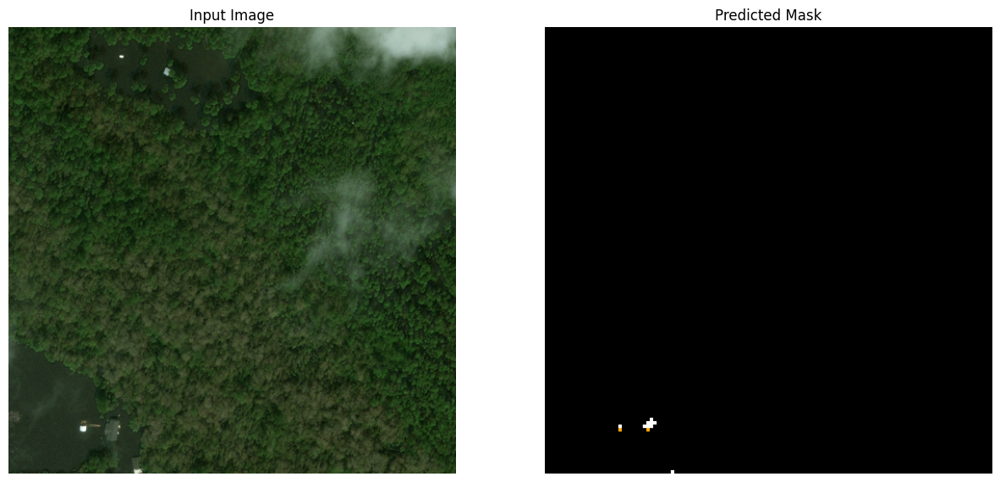

hurricane-michael hurricane-michael_00000231_post_disaster
1/1 [==============================] - 1s 628ms/step
predicted classes:  [0 1 2 3]


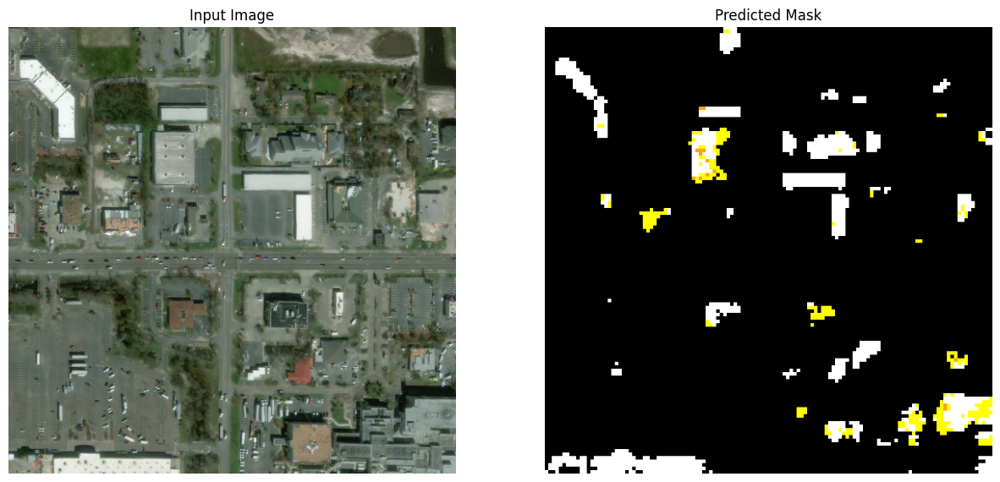

mexico-earthquake mexico-earthquake_00000057_post_disaster
1/1 [==============================] - 1s 531ms/step
predicted classes:  [0 1]


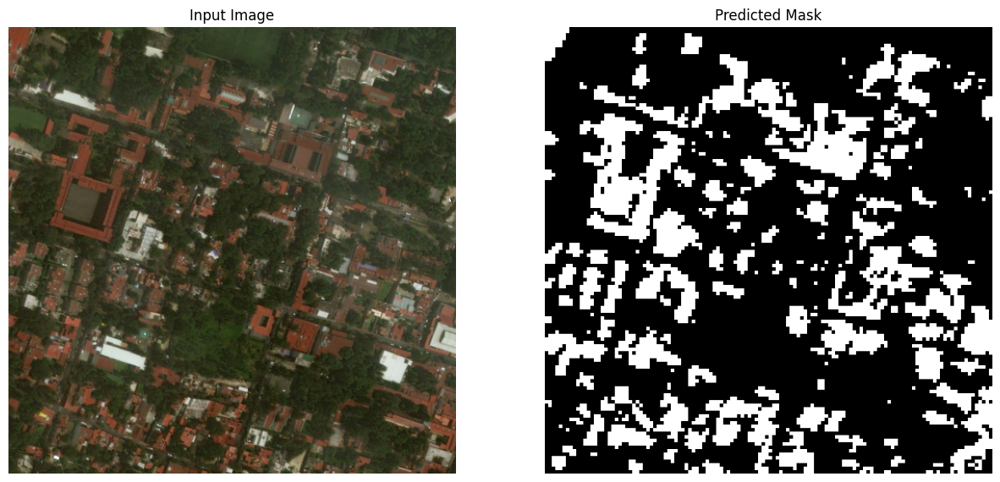

santa-rosa-wildfire santa-rosa-wildfire_00000277_post_disaster
1/1 [==============================] - 1s 534ms/step
predicted classes:  [0 1 3 4]


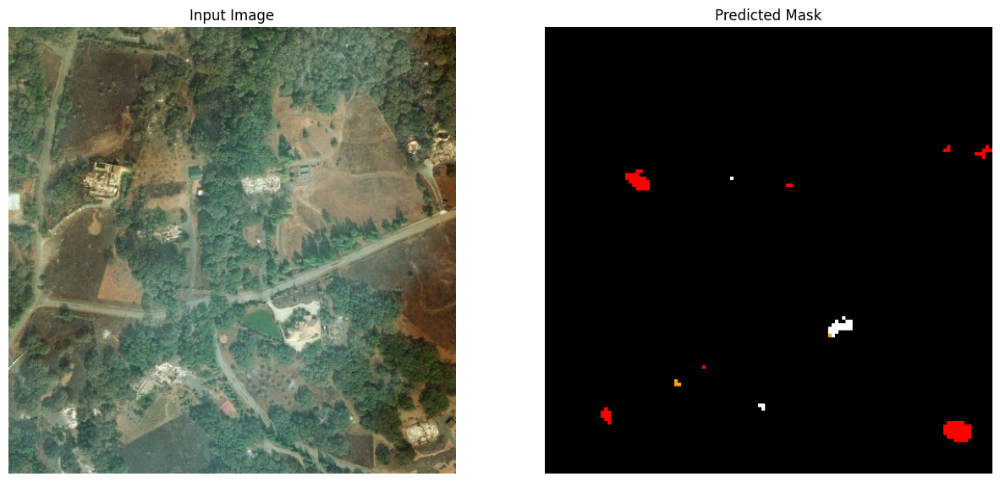

socal-fire socal-fire_00000383_post_disaster
1/1 [==============================] - 1s 506ms/step
predicted classes:  [0]


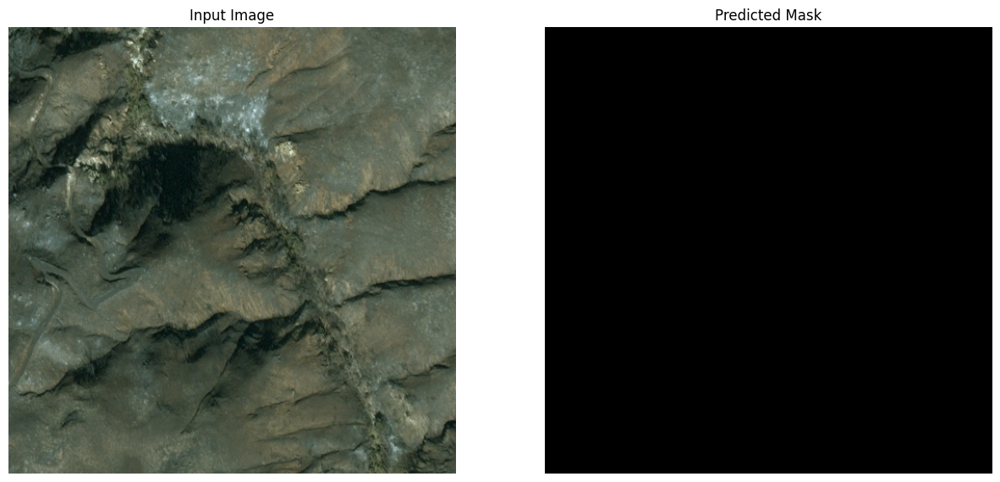

hurricane-matthew hurricane-matthew_00000043_post_disaster
1/1 [==============================] - 1s 520ms/step
predicted classes:  [0 1 2]


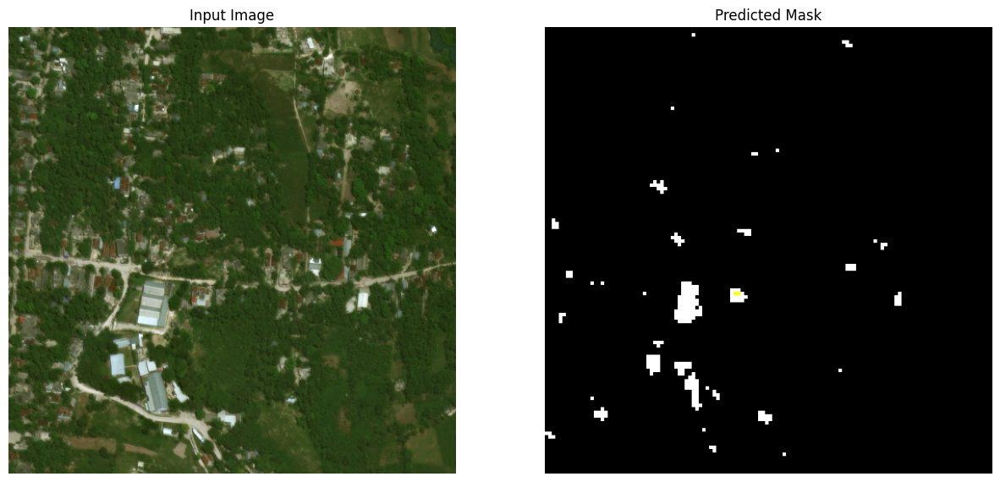

hurricane-florence hurricane-florence_00000291_post_disaster
1/1 [==============================] - 1s 547ms/step
predicted classes:  [0]


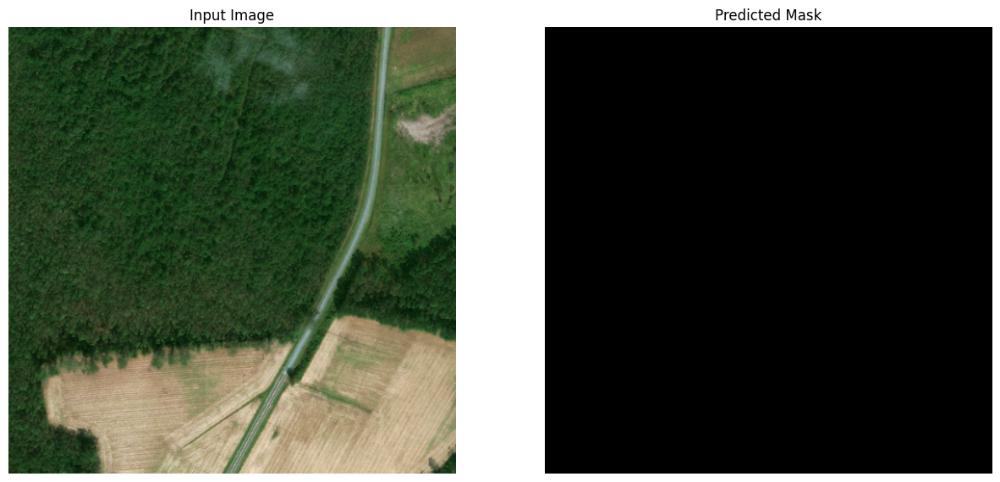

midwest-flooding midwest-flooding_00000064_post_disaster
1/1 [==============================] - 1s 547ms/step
predicted classes:  [0 1]


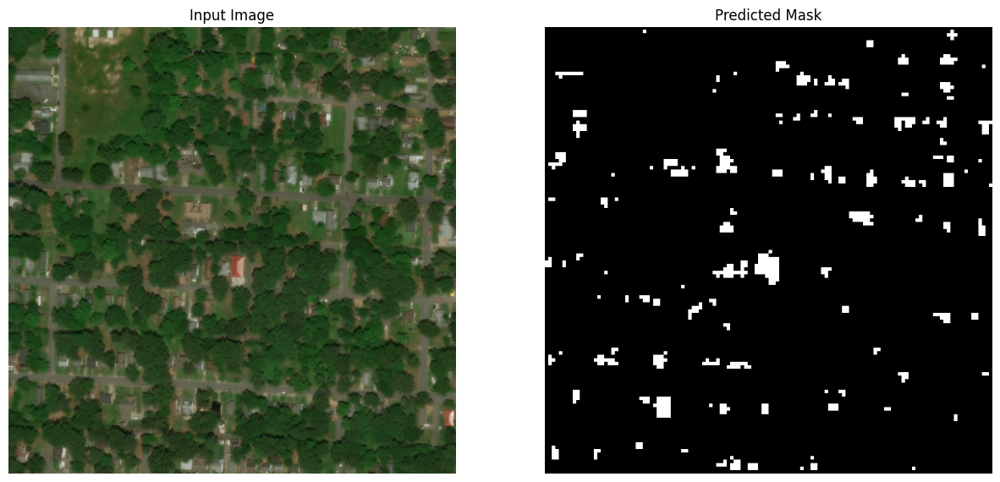

hurricane-michael hurricane-michael_00000305_post_disaster
1/1 [==============================] - 1s 566ms/step
predicted classes:  [0]


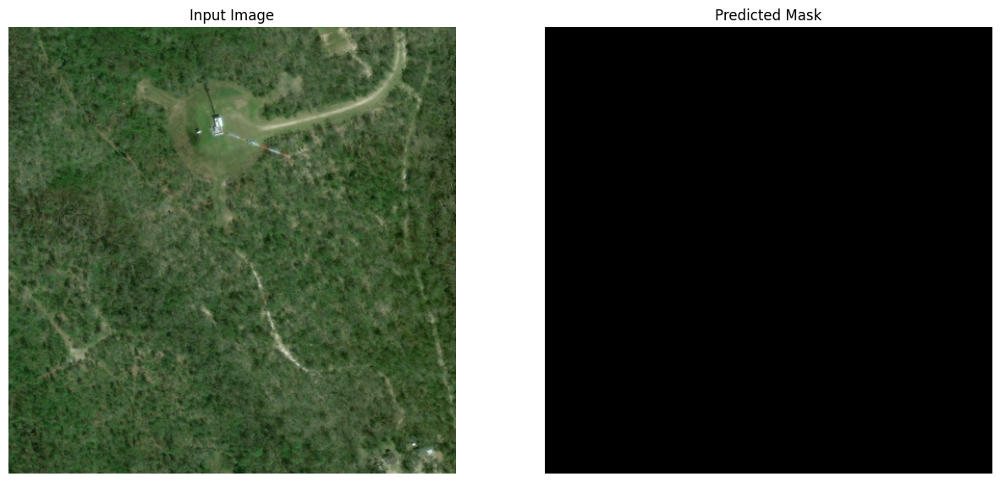

socal-fire socal-fire_00000004_post_disaster
1/1 [==============================] - 1s 542ms/step
predicted classes:  [0]


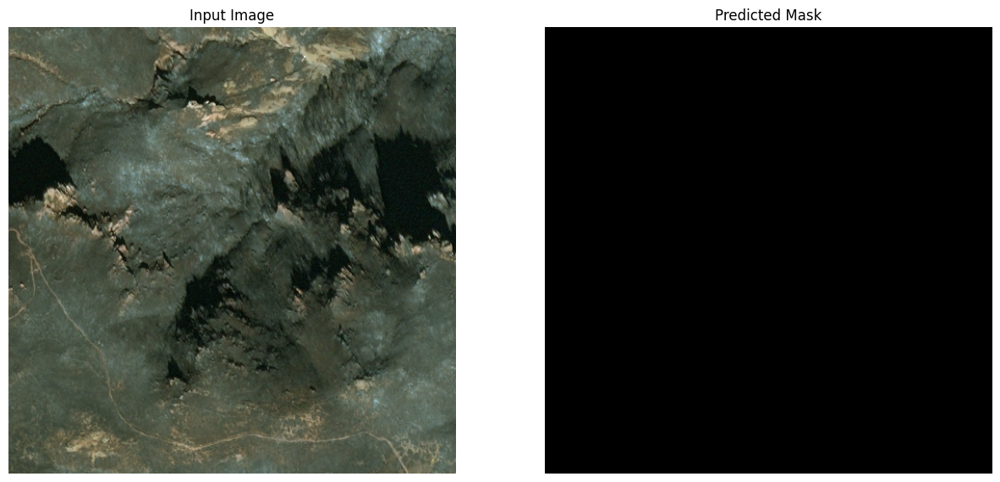

socal-fire socal-fire_00000563_post_disaster
1/1 [==============================] - 1s 581ms/step
predicted classes:  [0]


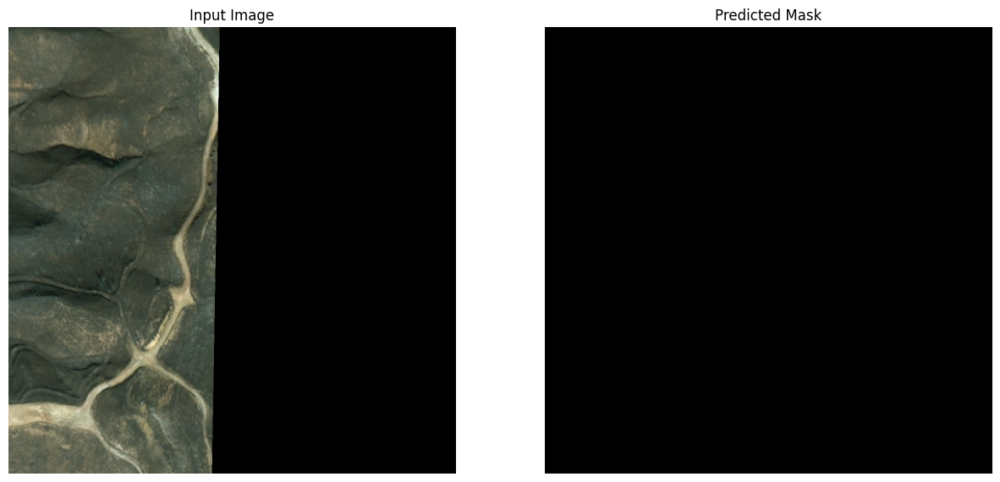

hurricane-florence hurricane-florence_00000022_post_disaster
1/1 [==============================] - 1s 594ms/step
predicted classes:  [0 1]


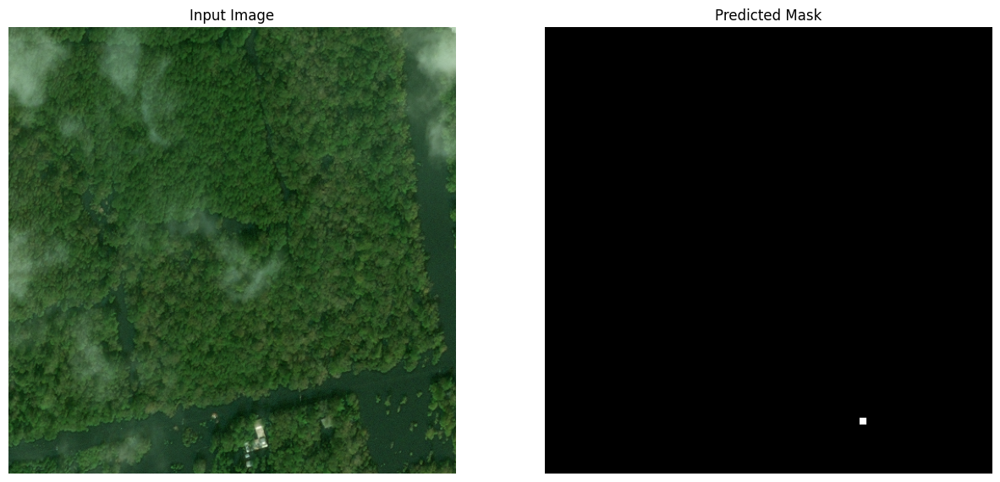

socal-fire socal-fire_00000634_post_disaster
1/1 [==============================] - 1s 507ms/step
predicted classes:  [0 1]


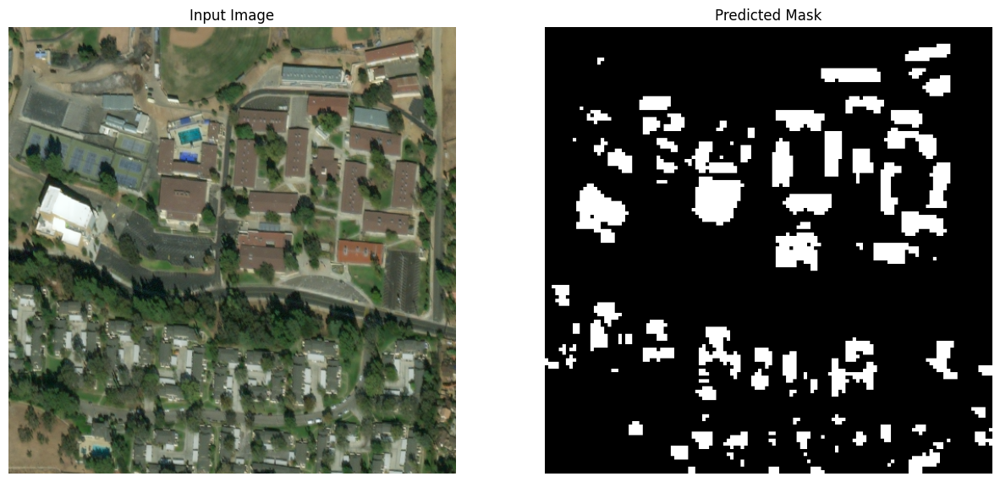

hurricane-harvey hurricane-harvey_00000140_post_disaster
1/1 [==============================] - 1s 562ms/step
predicted classes:  [0 1 2 3]


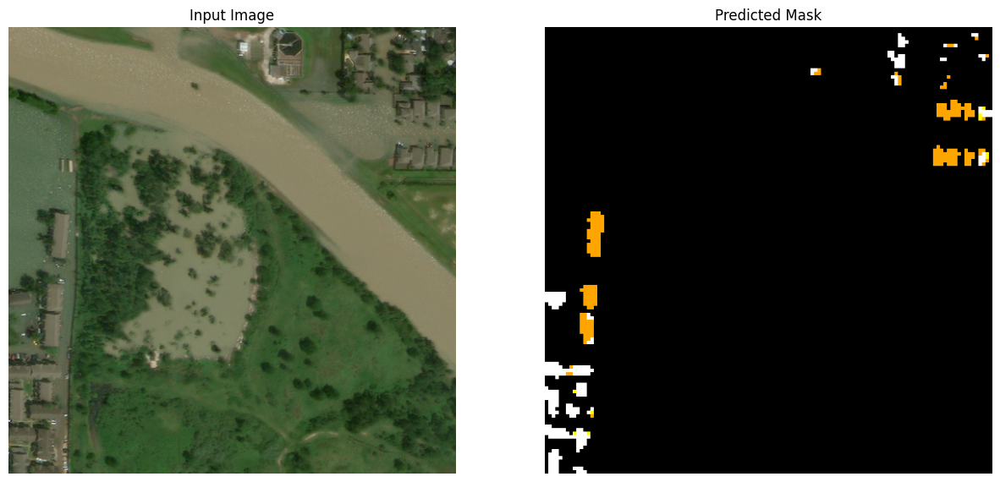

hurricane-florence hurricane-florence_00000188_post_disaster
1/1 [==============================] - 1s 532ms/step
predicted classes:  [0 1]


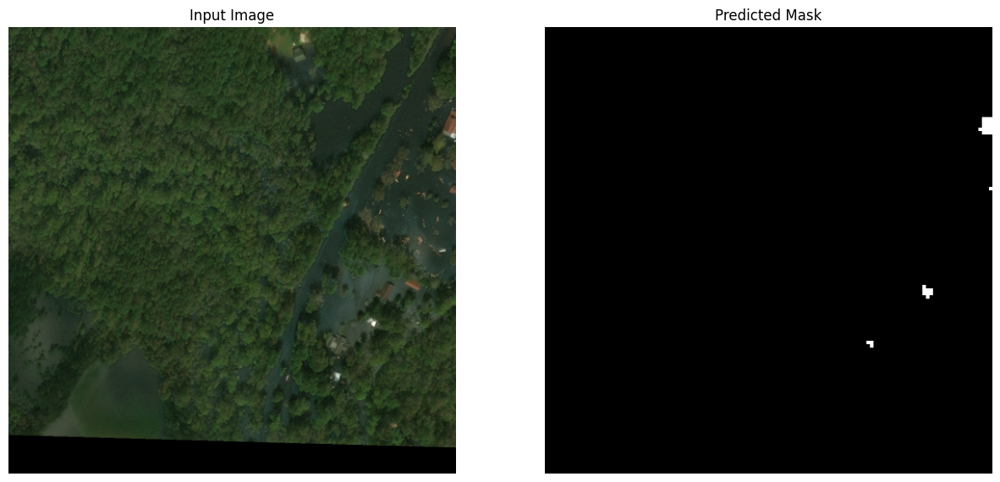

mexico-earthquake mexico-earthquake_00000087_post_disaster
1/1 [==============================] - 1s 564ms/step
predicted classes:  [0 1]


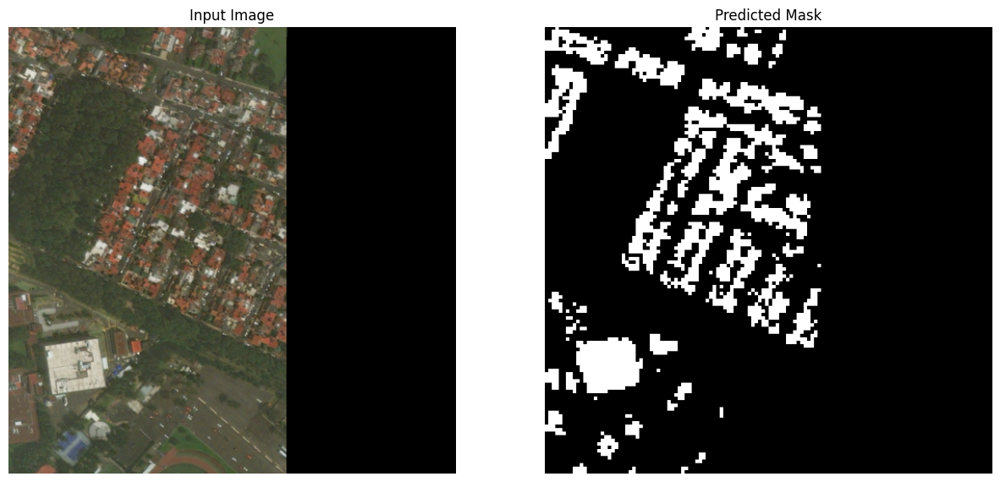

hurricane-michael hurricane-michael_00000052_post_disaster
1/1 [==============================] - 1s 600ms/step
predicted classes:  [0 1 2]


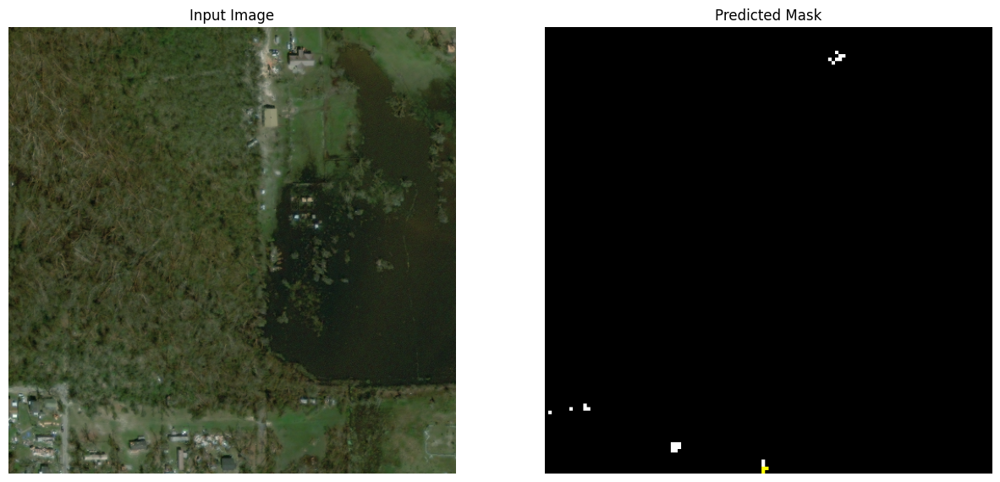

socal-fire socal-fire_00000487_post_disaster
1/1 [==============================] - 1s 573ms/step
predicted classes:  [0 1]


KeyboardInterrupt: 

In [39]:
# predicting and visualizing for each post image

from transformers import TFSegformerForSemanticSegmentation

#post
images = post

seg_model =  TFSegformerForSemanticSegmentation.from_pretrained(name_model, local_files_only=True)

#
for i,elem in enumerate(images):
    if dis:
        print(dis[i], id_post[i])
    #get image tensor
    image = elem["pixel_values"]
    #print(images_pre.shape)
    # add batch dimension, the model needs it
    image_batched = np.expand_dims(image, axis=0)
    # Use the loaded model to make predictions
    pred_seg=seg_model.predict(image_batched).logits
    #print("info prediction", pred_seg.shape,type(pred_seg))
    #convert the predicted mask to 
    final_pred_seg = create_mask_single(pred_seg)
    #print("info pred after create mask", final_pred_seg.shape,type(final_pred_seg))
    resized_pred_seg=tf.image.resize(final_pred_seg, (512, 512), method="nearest")
    #print("info resized pred", resized_pred_seg.shape)
    #checking if the classes predicted are in the correct range
    predicted_flat = np.array(final_pred_seg).astype(int).flatten()
    print("predicted classes: ",np.unique(predicted_flat))
    # # to plot
    image_plot = tf.transpose(image, (1, 2, 0))
    squeezed_predictions = tf.squeeze(resized_pred_seg, axis=0)  # Remove the batch dimension

    pred_mask_create_3ch = convert_mask_to_3_channels(np.array(squeezed_predictions))
    display([image_plot, pred_mask_create_3ch])


The cell above was interrupted given that the dataset was too large.